# Lab03: Model evaluation and calibration¶

<div class="alert alert-warning">
If figures/tables are not rendered correctly, make sure your notebook is `trusted` by running `Trust Notebook` operation found in `Commands` (third icon from the top on the toolbar located left-hand side). You can easily find this menu by typing in "trust" in the search box there.
</div>

<div class="alert alert-info">
This is a student version of the notebook that some portions of code are redacted with comments like `#= .. =#`. Students are encouraged to complete the code to get same/similar results as rendered in the notebook. A complete version of the notebook will be provided once the lab session is finished each week.
</div>

In [1]:
using Cropbox

In [2]:
new_install = false
if new_install
    import Pkg
    Pkg.add("CSV")
    Pkg.add("DataFrames")
    Pkg.add("DataFramesMeta")
    Pkg.add("StatsBase")    
    Pkg.add("Dates")
#pkg"add DataFrames DataFramesMeta StatsBase CSV"
end

   Updating registry at `~/.julia/registries/General`


   Updating git-repo `https://github.com/JuliaRegistries/General.git`


Fetching: [========================================>]  100.0 %

  Resolving package versions...
No Changes to `~/.julia/environments/v1.5/Project.toml`
No Changes to `~/.julia/environments/v1.5/Manifest.toml`


If you get errors running the cell below, some or all of the packages may not have been installed. In that case, change `new_install` to be `true` and run the cell abov to add those packages to the current kernel running in this environment.  

In [3]:
using DataFrames
using DataFramesMeta
using StatsBase
using CSV
using Dates

## Ex 3.1.

In this exercise, we will calibrate the logistic [Eqn 3.3] and Gompertz [Eqn 3.4] growth functions using experimental data from field corn research.

1. Calibrate the integral form of the logistic equation against the corn total shoot biomass data collected over time. What are your starting values for the parameters?
2. Do the same with the integral form of the Gompertz equation. What are your starting values for the parameters?
3. Evaluate the performance of the two models and determine which model fits data better. Use appropriate statistics as needed. Which model was easier with more interpretable parameters for you to determine their starting values?
4. Plot predicted vs observed values for both models and compare the results, and interpret the comparisons.

### Dataset

We can load CSV files into a table-like structure (`DataFrame`) using [CSV.jl](https://github.com/JuliaData/CSV.jl) package.

Cropbox additionally provides a convenience feature with `unitfy()` function that automatically handle units for each column. For example, if the column name was set to "LA (cm^2)" in the CSV file, it would be converted to a column named "LA" and its underlying type incorprating units of "cm^2".

Note that we used piping operator (`|>`) to hand over the data frame returned by `CSV.read()` to `unitfy()` function. It's identical as if we called `unitfy(CSV.read("..."))`.

In [4]:
corn = CSV.read("corn_sample.csv", DataFrame) |> unitfy

,year,jday,day,SampleNo,Stage,Ht,Diameter,TotLfNo,LA
,Int64,Int64,Date,Int64,String?,Float64?,Quantit…?,Int64?,Quantit…
1,2002,162,2002-06-11,1,V5,48.0,missing,7,178.57 cm²
2,2002,162,2002-06-11,2,V5,44.0,missing,8,220.09 cm²
3,2002,162,2002-06-11,3,V5,40.0,missing,7,152.73 cm²
4,2002,162,2002-06-11,4,V5,49.5,missing,8,306.52 cm²
5,2002,162,2002-06-11,5,V5,51.5,missing,9,276.78 cm²
6,2002,162,2002-06-11,6,V5,48.5,missing,8,198.26 cm²
7,2002,162,2002-06-11,7,V5,49.0,missing,8,207.5 cm²
8,2002,162,2002-06-11,8,V5,40.5,missing,7,135.7 cm²
9,2002,162,2002-06-11,9,V4,39.0,missing,7,123.88 cm²


There are many columns in the data frame as we can see with `names()` function.

In [5]:
names(corn)

17-element Array{String,1}:
 "year"
 "jday"
 "day"
 "SampleNo"
 "Stage"
 "Ht"
 "Diameter"
 "TotLfNo"
 "LA"
 "StemDW"
 "LfDW"
 "EarDW"
 "Green"
 "LfNo"
 "DAS"
 "shootDW"
 "SLA"

`DAS` means "days after sowing". We have dry weights (DW) for shoot (`shootDW`), stem (`StemDW`), leaf (`LfDW`), and ear (`EarDW`).

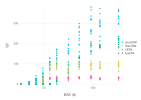

In [6]:
plot(corn, :DAS, [:shootDW, :StemDW, :LfDW, :EarDW])

Among them, we'll first use shoot dry weight (`shootDW`) to calibrate the logistic growth model we learned last week.

### Logistic Equation

- Eqn 3.3.

$$
W = \frac{W_f}{1 + (\frac{W_f}{W_0} - 1) e^{-rt}}
$$

- Table 3.1.

| Symbol | Value | Units | Description |
| :- | :- | :- | :- |
| $t$ | - | $\mathrm{d}$ | Time unit used in the model |
| $r$ | - | $\mathrm{g}$ $\mathrm{g^{-1}}$ $\mathrm{d^{-1}}$ | Relative (or specific or intrinsic) growth rate |
| $W_0$ | - | $\mathrm{g}$ | Seed mass or initial biomass |
| $W_f$ | - | $\mathrm{g}$ | Potential final mass of a plant |
| $W$ | - | $\mathrm{g}$ | Whole-plant biomass as dry matter (state variable) |

Here is the logistic growth model we're going to use for modeling biomass accumulation. It's basically the same as the system `Eq25` we used last week.

In [7]:
@system Logistic(Controller) begin
    t(context.clock.time) ~ track(u"d")
    
    r: relative_growth_rate ~ preserve(u"g/g/d", parameter)
    W0: initial_biomass ~ preserve(u"g", parameter)
    Wf: potential_final_biomass ~ preserve(u"g", parameter)
    
    W(t, r, W0, Wf): biomass => begin
        #= .. =#
    end ~ track(u"g")
end

Logistic

Cropbox provides `calibrate()` function to find out a set of parameters best describing the dataset it's provided with. Internally, it relies on [BlackBoxOptim.jl](https://github.com/robertfeldt/BlackBoxOptim.jl) for global optimization methods. If you're interested in local optimization methods, refer to [Optim.jl](https://github.com/JuliaNLSolvers/Optim.jl) package for more information.

`calibrate()` is in a form like `calibrate(<System>, <DataFrame>; index=<..>, target=<..>, parameters=<..>, metric=<..>, optim=(; <BlackBoxOptim options>..), <simulate() options>..`. It acceps arguments similar to `simulate()` for setting up simulations. Then it also requires a data frame for ground truth data and their column names for `index` and `target` variables. Oftentimes, it is in a time series like how our dataset is recorded for corn harvest measurements. `parameters` are in a format similar to Cropbox configuration object except that each variable has a tuple of values specifying lower and upper bounds of the parameter instead of an actual value.

In this case, we're calibrating three parameters, `r`, `W0`, and `Wf`, within a reasonable range of values. We use same period of simulation, 150 days, as `stop` condition. The deafult metric of cost (error) function used by calibration is [RMSE](https://en.wikipedia.org/wiki/Root-mean-square_deviation). More advanced options controlling BlackBoxOptim is specified in `optim` option including maximum steps of calibration which mainly determines how long calibration process can take.

In [8]:
lc = calibrate(Logistic, corn;
    index = :DAS => :t,
    target = :shootDW => :W,
    parameters = :0 => (;
        r = (0, 1),
        W0 = (0, 10),
        Wf = (0, 500),
    ),
    stop = 150u"d",
    metric = :rmse,
    optim = (;
        MaxSteps = 3000,
        TraceInterval = 10,
        RandomizeRngSeed = false,
    ),
)

Starting optimization with optimizer BlackBoxOptim.DiffEvoOpt{BlackBoxOptim.FitPopulation{Float64},BlackBoxOptim.RadiusLimitedSelector,BlackBoxOptim.AdaptiveDiffEvoRandBin{3},BlackBoxOptim.RandomBound{BlackBoxOptim.ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
10.00 secs, 1320 evals, 1181 steps, improv/step: 0.281 (last = 0.2811), fitness=32.544012744
20.01 secs, 2668 evals, 2529 steps, improv/step: 0.220 (last = 0.1669), fitness=30.621492211

Optimization stopped after 3001 steps and 23.49 seconds
Termination reason: Max number of steps (3000) reached
Steps per second = 127.74
Function evals per second = 133.66
Improvements/step = 0.21867
Total function evaluations = 3140


Best candidate found: [0.0731488, 1.77799, 333.833]

Fitness: 30.600897009



Config for 1 systems:
  0
    r  = 0.0731488
    W0 = 1.77799
    Wf = 333.833

After calibration, we found a set of parameter that can describe the observation reasonable well with fitness value of 30.79 which referrs to RMSE. In other words, our simulation with this particular set of parameters had an average error about 30 $\mathrm{g}$ compared to the original dataset.

The result of calibration is returned as a configuration object which can be directly plugged into `simluate()` or `visualize()`. Let's plot the result of simulation using the calibrated parameter set and compare it with the dataset used for calibration.

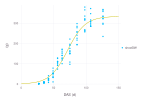

In [9]:
p = plot(corn, :DAS, :shootDW; xlim=(0,150))
visualize!(p, Logistic, :t, :W; config=lc, stop=150u"d", kind=:line)

Here is an equivalent one-line call using `visualize(<DataFrame>, <System>, <x>, <y>; <simulate() options>.., <plot() options>..)`.

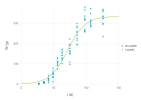

In [10]:
visualize(corn, Logistic, :DAS => :t, :shootDW => :W; config=lc, stop=150u"d", xlim=(0,150))

Slightly different form of `visualize(<DataFrame>, <System>, <y>; index=<..>, <simulate() options>.., <plot() options>..)` provides a 1:1 plot with observation against model estimation.

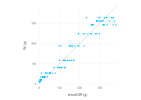

In [11]:
visualize(corn, Logistic, :shootDW => :W; index=:DAS => :t, config=lc, stop=150u"d")

### What if we don't need to calibrate all parameters at the same time?

Sometimes we may not need or wish to calibrate all parameters in a model at the same time. It may be preferable to determine a parameter value based on the literature or prior knowledge instead of going through calibration process in some cases especially if those prior values have solid biological ground and data are limited. For example, it is relatively simple to determine the seed mass of corn before planting. Here, we will use seed mass ($W_0$) of 0.275g based on our prior knowledge of the mass of a corn kernel.  This will help us reduce the number of prameters to calibrate. This might sacrifice the fitness (e.g., rmse) but that's ok and we can determine how much fitness is lost, and whether it was worth it. There could be multiple ways to do this. Let's think about how we can achieve this in `Cropbox`.

In [12]:
lc1 = calibrate(Logistic, corn;
index = :DAS => :t,
target = :shootDW => :W,
parameters = Logistic => (;
    r = (0, 1),
    W0 = #= .. =#,
    Wf = (0, 500),
),
stop = 150u"d",
metric = :rmse,
)

Starting optimization with optimizer BlackBoxOptim.DiffEvoOpt{BlackBoxOptim.FitPopulation{Float64}, BlackBoxOptim.RadiusLimitedSelector, BlackBoxOptim.AdaptiveDiffEvoRandBin{3}, BlackBoxOptim.RandomBound{BlackBoxOptim.ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps

Optimization stopped after 5001 steps and 5.35 seconds
Termination reason: Max number of steps (5000) reached
Steps per second = 934.07
Function evals per second = 869.26
Improvements/step = 0.27340
Total function evaluations = 4654


Best candidate found: [0.101545, 0.275, 312.61]

Fitness: 34.122577487



r,=,0.101545 d^-1
W0,=,0.275 g
Wf,=,312.61 g


### Gompertz Equation

- Eqn 3.4.

$$
W = W_0 \exp \left[ \frac{r_0}{\alpha} (1 - e^{-\alpha t}) \right]
$$

- Table 3.1.

| Symbol | Value | Units | Description |
| :- | :- | :- | :- |
| $t$ | - | $\mathrm{d}$ | Time unit used in the model |
| $r_0$ | - | $\mathrm{g}$ $\mathrm{g^{-1}}$ $\mathrm{d^{-1}}$ | Initial intrinsic growth rate before loss of efficiency |
| $W_0$ | - | $\mathrm{g}$ | Seed mass or initial biomass |
| $\alpha$ | - | $\mathrm{d^{-1}}$ | Decay rate of the growth efficiency over time |
| $W$ | - | $\mathrm{g}$ | Whole-plant biomass as dry matter (state variable) |

In [12]:
@system Gompertz(Controller) begin
    t(context.clock.time) ~ track(u"d")
    
    #= .. =#: initial_intrinsic_growth_rate ~ preserve(u"g/g/d", parameter)
    #= .. =#: initial_biomass ~ preserve(u"g", parameter)
    #= .. =#: growth_decay_rate ~ preserve(u"d^-1", parameter)
    
    W(#= .. =#): biomass => begin
        #= .. =#
    end ~ track(u"g")
end

Gompertz

In [13]:
gc = calibrate(Gompertz, corn;
    index = #= .. =#,
    target = #= .. =#,
    parameters = :0 => (;
        r0 = (0, 1),
        W0 = (0, 10),
        α = (0, 1),
    ),
    stop = 150u"d",
    metric = :rmse,
    optim = (;
        MaxSteps = 3000,
        TraceInterval = 10,
        RandomizeRngSeed = false,
    ),
)

Starting optimization with optimizer BlackBoxOptim.DiffEvoOpt{BlackBoxOptim.FitPopulation{Float64},BlackBoxOptim.RadiusLimitedSelector,BlackBoxOptim.AdaptiveDiffEvoRandBin{3},BlackBoxOptim.RandomBound{BlackBoxOptim.ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
10.01 secs, 991 evals, 883 steps, improv/step: 0.257 (last = 0.2571), fitness=96.043097140
20.01 secs, 1936 evals, 1828 steps, improv/step: 0.195 (last = 0.1376), fitness=45.242064737
30.05 secs, 2911 evals, 2803 steps, improv/step: 0.181 (last = 0.1549), fitness=38.936092374

Optimization stopped after 3001 steps and 32.09 seconds
Termination reason: Max number of steps (3000) reached
Steps per second = 93.53
Function evals per second = 96.90
Improvements/step = 0.18233
Total function evaluations = 3109


Best candidate found: [0.113347, 2.1937, 0.0207095]

Fitness: 38.532950015



Config for 1 systems:
  0
    r0 = 0.113347
    W0 = 2.1937
    α  = 0.0207095

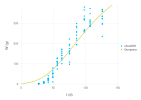

In [14]:
visualize(corn, Gompertz, #= .. =#, #= .. =#; config=#= .. =#, stop=150u"d", xlim=(0,150))

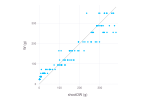

In [15]:
visualize(corn, Gompertz, :shootDW => :W; index=:DAS => :t, config=gc, stop=150u"d")

### Model Evaluation

Cropbox provides `evaluate()` function, which is in a similart form to `calibrate()`, for calculating a measure of error between observation input and simulation output. We can specify an arbitrary metric function in `metric` option that accepts a list of estimated values (`E`) and corresponding observed values (`O`) and returns a meausre of error.

#### Root Mean Square Error (RMSE)

- Eqn 3.1.

$$
\mathrm{RMSE} = \sqrt{\frac{\sum_{i=1}^N (\hat{y}_i - y_i)^2}{N}}
$$

RMSE can be defined by a simple function like this.

In [16]:
rmse(E, O) = √mean((E .- O).^2)

rmse (generic function with 1 method)

Then call `evaluate()` with our `rmse()` function to calculate RMSE from our simulation.

In [17]:
evaluate(Logistic, corn;
    config = lc,
    index = :DAS => :t,
    target = :shootDW => :W,
    stop = 150u"d",
    metric = rmse,
)

30.600897009060812 g

Actually, Cropbox already has an implementation of commonly used metric functions including RMSE and EF. They are specified by pre-defined symbols (*i.e.* `:rmse` for RMSE, `:ef` for EF).

In [18]:
evaluate(Logistic, corn;
    config = lc,
    index = :DAS => :t,
    target = :shootDW => :W,
    stop = 150u"d",
    metric = :rmse,
)

30.600897009060812 g

In [19]:
evaluate(Gompertz, corn;
    config = gc,
    index = :DAS => :t,
    target = :shootDW => :W,
    stop = 150u"d",
    metric = :rmse,
)

38.53295001507458 g

Note that RMSE shares the same units (`g`) with the `target` variable which is shoot biomass (`shootDW` in the dataset mapped to `W` in the model) in this example.

Also beware that what we just did above was not a proper **validation** of calibrated model since the dataset we used for calibration was used again for calculating a measure of error. In other words, we were just looking at the fitness of calibration itself. For validation, we need another dataset independent of calibration.

#### Model Efficiency (EF)

- Eqn 3.2.

$$
\mathrm{EF} = 1 - \frac{\sum_i (\hat{y}_i - y_i)^2}{\sum_i (y_i - \bar{y})^2}
$$

Model efficiency (EF), or more specficially, Nash-Sutcliffe model efficiency coefficient (NSE) can be defined in a similar way.

In [20]:
ef(E, O) = 1 - sum((E .- O).^2) / sum((O .- mean(O)).^2)

ef (generic function with 1 method)

In [21]:
evaluate(Logistic, corn;
    config = lc,
    index = :DAS => :t,
    target = :shootDW => :W,
    stop = 150u"d",
    metric = :ef,
)

0.9382703731723556

In [22]:
evaluate(Gompertz, corn;
    config = gc,
    index = :DAS => :t,
    target = :shootDW => :W,
    stop = 150u"d",
    metric = :ef,
)

0.9021209252447414

The maximum value of EF is 1 which indicates a perfect model. When EF is zero, the model has the same predictive power as mean of observations. A negative value of EF indicates the model is worse than the observation mean. $Cropbox$ provides additional metrics of model evaluation such as Willmott's revised $d$ (`:dr`), mean absolute error (`:mae`), nornalized RMSE (`:nrmse`) among others.

## Ex 3.2.

In this exercise, we will calibrate the Lotka-Volterra equations to fit the data of lynx and hare populations collected by the Hudson Bay Company.

1. In the previous exercises in Unit 2, we examined the behavior of the Lotoka-Volterra equations. Recall the parameter values for density independent L-V equations that you estimated by visual examination and plot the predator-prey dynamics based on those values.
2. Apply an optimization method (i.e., DE) to find the set of parameter values that minimizes the residuals. 
3. Compare the model predictions based on two different parameter sets (visual vs. DE calibrated) against the observations and test their goodness of fit (RMSE) and model efficiency.
4. Plot predicted vs observed values for both models and compare, and interpret the comparisons.

### Dataset

This dataset contains the number of pelts (in thousands) of Canadian lynx and snowshow hare traded by the Hudson Bay Trading Company in Canada from 1845 to 1935.

In [35]:
pelts = CSV.read("hare_lynx_data.csv", DataFrame) |> unitfy

,Year,Hare,Lynx
,Quantit…,Float64,Float64
1,1845 yr,19.58,30.09
2,1846 yr,19.6,45.15
3,1847 yr,19.61,49.15
4,1848 yr,11.99,39.52
5,1849 yr,28.04,21.23
6,1850 yr,58.0,8.42
7,1851 yr,74.6,5.56
8,1852 yr,75.09,5.08
9,1853 yr,88.48,10.17


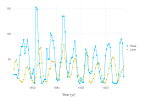

In [36]:
plot(pelts, :Year, [:Hare, :Lynx], kind=:scatterline)

Among them, data from 1900 to 1920 has been widely used as an example for demonstrating Lotka-Volterra model as it clearly shows a pattern that predator population closely follows a trajectory of prey population and vice versa.

Let's make a subset of the data by using [DataFramesMeta.jl](https://github.com/JuliaData/DataFramesMeta.jl) which provides convenient macros like `@where` to extract a subset of data frame in regards with certain conditions.

In [37]:
hare_lynx = @where(pelts, 1900u"yr" .<= :Year .<= 1920u"yr")

,Year,Hare,Lynx
,Quantit…,Float64,Float64
1,1900 yr,12.82,7.13
2,1901 yr,4.72,9.47
3,1902 yr,4.73,14.86
4,1903 yr,37.22,31.47
5,1904 yr,69.72,60.57
6,1905 yr,57.78,63.51
7,1906 yr,28.68,54.7
8,1907 yr,23.37,6.3
9,1908 yr,21.54,3.41


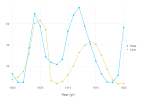

In [38]:
plot(hare_lynx, :Year, [:Hare, :Lynx], kind=:scatterline)

### Model

- Eqn 3.5.

$$
\begin{align}
\frac{dN}{dt} &= bN - aNP \\
\frac{dP}{dt} &= caNP - mP \\
\end{align}
$$

- Table 3.1.

| Symbol | Value | Units | Description |
| :- | :- | :- | :- |
| $t$ | - | $\mathrm{yr}$ | Time unit used in the model |
| $N$ | - | - | Prey population as number of individuals (state variable) |
| $P$ | - | - | Predator population as number of individuals (state variable) |
| $N_0$ | - | - | Initial prey population |
| $P_0$ | - | - | Initial predator population |
| $b$ | - | $\mathrm{yr^{-1}}$ | Per capital birth rate that defines the intrinsic growth rate of prey population |
| $a$ | - | $\mathrm{yr^{-1}}$ | Attack rate or predation rate |
| $c$ | - | - | Conversion efficiency of an eaten prey into new predator; predator's reproduction efficiency per prey consumed) |
| $m$ | - | $\mathrm{yr^{-1}}$ | Mortality rate of predator population |

Here is `LotkaVolterra` system we created. You may have noticed new parameter `y0` for setting the start year and a new variable `y` for keeping track of the year in the same way as we have in the dataset.

In [39]:
@system LotkaVolterra(Controller) begin
    t(context.clock.time) ~ track(u"yr")
    y(t): year => t ~ track::Int(u"yr", round)
    
    N(#= .. =#): prey_population => #= .. =# ~ #= .. =#(#= .. =#)
    P(#= .. =#): predator_population => #= .. =# ~ #= .. =#(#= .. =#)
    
    N0: prey_initial_population ~ preserve(parameter)
    P0: predator_initial_population ~ preserve(parameter)
    
    b: prey_birth_rate ~ preserve(u"yr^-1", parameter)
    a: predation_rate ~ preserve(u"yr^-1", parameter)
    c: predator_reproduction_rate ~ preserve(parameter)
    m: predator_mortality_rate ~ preserve(u"yr^-1", parameter)
end

LotkaVolterra

For reference, here is the default set of parameters we are going to use.

In [40]:
lvc = @config (
    :Clock => (;
        init = 1900u"yr",
        step = 1u"d",
    ),
    :LotkaVolterra => (;
        b = 0.6,
        a = 0.02,
        c = 0.5,
        m = 0.5,
        N0 = 20,
        P0 = 30,
    ),
)

Config for 2 systems:
  Clock
    init = 1900 yr
    step = 1 d
  LotkaVolterra
    b  = 0.6
    a  = 0.02
    c  = 0.5
    m  = 0.5
    N0 = 20
    P0 = 30

### Calibration

We again use `calibrate()` function to get calibration done. A notable difference is that now we have to fit our parameters in regards with two `target` variables, `N` and `P` which are provided in a list of mappings. Also note that the use of mapping for `index` variable from `Year` in the dataset to `y` (`year`) in the model. Baseline `config` is needed for setting up default time step (`context.clock.step`) and starting year (`y0`). The range of parameter values are chosen arbitrarily large to cover dynamics we saw in the dataset.

`snap` option explicitly indicates that our simulation output should be recorded at 365 days interval from the model snapshot. It is required due to peculiarity of handling yearly units where `1u"yr"` equals to `365.25u"d"`.

#### 20 years

In [41]:
lvcc = calibrate(LotkaVolterra, hare_lynx;
    index = :Year => :y,
    target = [:Hare => :N, :Lynx => :P],
    config = lvc,
    parameters = :0 => (;
        b = (0, 2),
        a = (0, 2),
        c = (0, 2),
        m = (0, 2),
        N0 = (0, 100),
        P0 = (0, 100),
    ),
    stop = 20u"yr",
    snap = 365u"d",
    optim = (;
        MaxSteps = 3000,
        TraceInterval = 10,
        RandomizeRngSeed = false,
    ),
)

Starting optimization with optimizer BlackBoxOptim.BorgMOEA{BlackBoxOptim.EpsBoxDominanceFitnessScheme{2,Float64,true,typeof(mean)},BlackBoxOptim.ProblemEvaluator{Tuple{Float64,Float64},BlackBoxOptim.IndexedTupleFitness{2,Float64},BlackBoxOptim.EpsBoxArchive{2,Float64,BlackBoxOptim.EpsBoxDominanceFitnessScheme{2,Float64,true,typeof(mean)}},BlackBoxOptim.FunctionBasedProblem{BlackBoxOptim.ParetoFitnessScheme{2,Float64,true,typeof(mean)},BlackBoxOptim.ContinuousRectSearchSpace,Nothing}},BlackBoxOptim.FitPopulation{BlackBoxOptim.IndexedTupleFitness{2,Float64}},BlackBoxOptim.FixedGeneticOperatorsMixture,BlackBoxOptim.RandomBound{BlackBoxOptim.ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
pop.size=50 arch.size=0 n.restarts=0
10.00 secs, 1173 evals, 959 steps, fitness=(18.62956, 9.86225) agg=14.24591
pop.size=50 arch.size=19 n.restarts=0
20.01 secs, 3243 evals, 2463 steps, fitness=(17.59380, 10.18933) agg=13.89156
pop.size=160 arch.size=49 n.restarts=2

Optimization stopped after 3

Config for 1 systems:
  0
    b  = 0.72269
    a  = 0.0247981
    c  = 0.861718
    m  = 0.749137
    N0 = 21.9214
    P0 = 14.8722

Let's make a comparison plot between observations and model predictions.

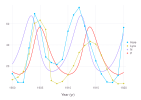

In [42]:
p = plot(hare_lynx, :Year, [:Hare, :Lynx], kind=:scatterline)
visualize!(p, LotkaVolterra, :t, [:N, :P]; config=(lvc, lvcc), stop=20u"yr", kind=:line)

In [43]:
evaluate(LotkaVolterra, hare_lynx;
    index = :Year => :y,
    target = [:Hare => :N, :Lynx => :P],
    config = (lvc, lvcc),
    stop = 20u"yr",
    snap = 365u"d",
    metric = :rmse,
)

13.806195417628643

In [44]:
evaluate(LotkaVolterra, hare_lynx;
    index = :Year => :y,
    target = [:Hare => :N, :Lynx => :P],
    config = (lvc, lvcc),
    stop = 20u"yr",
    snap = 365u"d",
    metric = :ef,
)

0.5866659675294656

#### 90 years

As an exercise, let's try calibration with the full dataset for simulating 90 years of period. It'll be much harder as the dataset is more noisy and doesn't show a clear pattern. How does the modeling output look like?

In [45]:
lvc0 = @config lvc, :Clock => :init => 1845u"yr"

Config for 2 systems:
  Clock
    init = 1845 yr
    step = 1 d
  LotkaVolterra
    b  = 0.6
    a  = 0.02
    c  = 0.5
    m  = 0.5
    N0 = 20
    P0 = 30

In [46]:
lvcc0 = calibrate(LotkaVolterra, pelts;
    index = #= .. =#,
    target = [#= .. =#, #= .. =#],
    config = lvc0,
    parameters = :0 => (;
        b = #= .. =#,
        a = #= .. =#,
        c = #= .. =#,
        m = #= .. =#,
        N0 = #= .. =#,
        P0 = #= .. =#,
    ),
    stop = #= .. =#,
    snap = 365u"d",
    optim = (;
        MaxSteps = 2000,
        TraceInterval = 10,
        RandomizeRngSeed = false,
    ),
)

Starting optimization with optimizer BlackBoxOptim.BorgMOEA{BlackBoxOptim.EpsBoxDominanceFitnessScheme{2,Float64,true,typeof(mean)},BlackBoxOptim.ProblemEvaluator{Tuple{Float64,Float64},BlackBoxOptim.IndexedTupleFitness{2,Float64},BlackBoxOptim.EpsBoxArchive{2,Float64,BlackBoxOptim.EpsBoxDominanceFitnessScheme{2,Float64,true,typeof(mean)}},BlackBoxOptim.FunctionBasedProblem{BlackBoxOptim.ParetoFitnessScheme{2,Float64,true,typeof(mean)},BlackBoxOptim.ContinuousRectSearchSpace,Nothing}},BlackBoxOptim.FitPopulation{BlackBoxOptim.IndexedTupleFitness{2,Float64}},BlackBoxOptim.FixedGeneticOperatorsMixture,BlackBoxOptim.RandomBound{BlackBoxOptim.ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
pop.size=50 arch.size=0 n.restarts=0
10.01 secs, 505 evals, 364 steps, fitness=(34.49471, 14.31239) agg=24.40355
pop.size=50 arch.size=10 n.restarts=0
20.01 secs, 1011 evals, 747 steps, fitness=(33.50587, 14.63075) agg=24.06831
pop.size=50 arch.size=16 n.restarts=0
30.04 secs, 1520 evals, 1072 st

Config for 1 systems:
  0
    b  = 1.05009
    a  = 0.0410096
    c  = 0.256023
    m  = 0.401247
    N0 = 46.3498
    P0 = 38.976

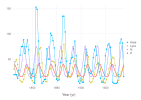

In [47]:
p = plot(pelts, #= .. =#, #= .. =#, kind=:scatterline)
visualize!(p, LotkaVolterra, #= .. =#, #= .. =#; config=(lvc0, lvcc0), stop=90u"yr", kind=:line)

In [48]:
evaluate(LotkaVolterra, pelts;
    index = #= .. =#,
    target = #= .. =#,
    config = (lvc0, lvcc0),
    stop = #= .. =#,
    snap = 365u"d",
    metric = :rmse,
)

23.443317270390416

In [49]:
evaluate(LotkaVolterra, pelts;
    index = #= .. =#,
    target = #= .. =#,
    config = (lvc0, lvcc0),
    stop = #= .. =#,
    snap = 365u"d",
    metric = :ef,
)

0.3106579476490289

Calibrate the *density-dependent* Lotka-Volterra model using the observational data. How do the parameter estimates compare with that of density independent model? How do the model behavior compare? 

### Model

- Eqn 3.6.

$$
\begin{align}
\frac{dN}{dt} &= bN-\frac{b}{K}N^2-aNP \\
\frac{dP}{dt} &= caNP-mP \\
\end{align}
$$

- Table 3.1.

| Symbol | Value | Units | Description |
| :- | :- | :- | :- |
| $t$ | - | $\mathrm{yr}$ | Time unit used in the model |
| $N$ | - | - | Prey population as number of individuals (state variable) |
| $P$ | - | - | Predator population as number of individuals (state variable) |
| $N_0$ | - | - | Initial prey population |
| $P_0$ | - | - | Initial predator population |
| $b$ | - | $\mathrm{yr^{-1}}$ | Per capital birth rate that defines the intrinsic growth rate of prey population |
| $a$ | - | $\mathrm{yr^{-1}}$ | Attack rate or predation rate |
| $c$ | - | - | Conversion efficiency of an eaten prey into new predator; predator's reproduction efficiency per prey consumed) |
| $m$ | - | $\mathrm{yr^{-1}}$ | Mortality rate of predator population |
| $K$ | - | - | Carrying capacity of the system for prey population |

In case we want, here is `LotkaVolterraDD` system based on the new `LotkaVolterra`. There is no change in the model specification itself.

In [50]:
@system LotkaVolterraDD(#= .. =#, Controller) begin
    N(#= .. =#): prey_population => begin
        #= .. =#
    end ~ #= .. =#(#= .. =#)
    
    K: #= .. =# ~ #= .. =#(#= .. =#)
end

LotkaVolterraDD

In [51]:
lvddc = @config (lvc0,
    :LotkaVolterraDD => (;
        K = 1000,
    ),
)

Config for 3 systems:
  Clock
    init = 1845 yr
    step = 1 d
  LotkaVolterra
    b  = 0.6
    a  = 0.02
    c  = 0.5
    m  = 0.5
    N0 = 20
    P0 = 30
  LotkaVolterraDD
    K = 1000

### Calibration

As an extra, here is the same calibration done for density-dependent version of the model `LotkaVolterraDD`.

In [52]:
lvddcc = calibrate(LotkaVolterraDD, pelts;
    index = :Year => :y,
    target = [:Hare => :N, :Lynx => :P],
    config = lvddc,
    parameters = :0 => (;
        b = (0, #= .. =#),
        a = (0, #= .. =#),
        c = (0, #= .. =#),
        m = (0, #= .. =#),
        N0 = (0, #= .. =#),
        P0 = (0, #= .. =#),
        K = (0, #= .. =#),
    ),
    stop = 90u"yr",
    snap = 365u"d",
    optim = (;
        MaxSteps = 3000,
        TraceInterval = 10,
        RandomizeRngSeed = false,
    ),
)

Starting optimization with optimizer BlackBoxOptim.BorgMOEA{BlackBoxOptim.EpsBoxDominanceFitnessScheme{2,Float64,true,typeof(mean)},BlackBoxOptim.ProblemEvaluator{Tuple{Float64,Float64},BlackBoxOptim.IndexedTupleFitness{2,Float64},BlackBoxOptim.EpsBoxArchive{2,Float64,BlackBoxOptim.EpsBoxDominanceFitnessScheme{2,Float64,true,typeof(mean)}},BlackBoxOptim.FunctionBasedProblem{BlackBoxOptim.ParetoFitnessScheme{2,Float64,true,typeof(mean)},BlackBoxOptim.ContinuousRectSearchSpace,Nothing}},BlackBoxOptim.FitPopulation{BlackBoxOptim.IndexedTupleFitness{2,Float64}},BlackBoxOptim.FixedGeneticOperatorsMixture,BlackBoxOptim.RandomBound{BlackBoxOptim.ContinuousRectSearchSpace}}
0.00 secs, 0 evals, 0 steps
pop.size=50 arch.size=0 n.restarts=0
10.02 secs, 512 evals, 352 steps, fitness=(36.44972, 18.72290) agg=27.58631
pop.size=50 arch.size=8 n.restarts=0
20.02 secs, 1029 evals, 710 steps, fitness=(36.20890, 18.72492) agg=27.46691
pop.size=50 arch.size=11 n.restarts=0
30.06 secs, 1544 evals, 1011 ste

Config for 1 systems:
  0
    b  = 0.536595
    a  = 0.0347692
    c  = 0.555745
    m  = 0.899386
    N0 = 10.2044
    P0 = 31.0326
    K  = 491.654

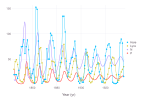

In [53]:
p = plot(pelts, :Year, [:Hare, :Lynx], kind=:scatterline)
visualize!(p, LotkaVolterraDD, :t, [:N, :P]; config=(lvddc, lvddcc), stop=90u"yr", kind=:line)

In [54]:
evaluate(LotkaVolterraDD, pelts;
    index = :Year => :y,
    target = [:Hare => :N, :Lynx => :P],
    config = (lvddc, lvddcc),
    stop = 90u"yr",
    snap = 365u"d",
    metric = :rmse,
)

25.52696139485267

In [55]:
evaluate(LotkaVolterraDD, pelts;
    index = :Year => :y,
    target = [:Hare => :N, :Lynx => :P],
    config = (lvddc, lvddcc),
    stop = 90u"yr",
    snap = 365u"d",
    metric = :ef,
)

0.017924295983093752